# **Computer Vison Assignment**

- In this code, we mantained an automation first approach, so we organized our code mainly in functions, in case we wanted to automate the code, and eventually put it in production.
- Additionally, we ran the functions with the images as input, so as to display the results as asked by the professor.
- This project is about computer vision applied to MMs detection, using mainly the package opencv from python

**Done by:**
- Victor Freitas (up202104469)
- Tomás Rodrigues (up202202467)

In [ ]:
import numpy as np
import cv2
import os
import glob
import math
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


import warnings
warnings.filterwarnings('ignore')


In [ ]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## Configuration
This variable has the configuration to detect the color of each MMs. The configurations set, for each color, the lower bound and upper bound to make a mask for that color in HSV color model.
For example, for yellow color, the bounds for HUE are 15 -> 40, Saturation 120 -> 255, value: 20 -> 255

In [ ]:
config = {
    "mms_config": [
        {
            "color": "blue",
            "lower_mask": np.array([100,120,20]),
            "upper_mask": np.array([120,255,255])
        },
        {
            "color": "yellow",
            "lower_mask": np.array([15,120,20]),
            "upper_mask": np.array([40,255,255])
        },
        {
            "color": "red",
            "lower_mask": [np.array([0,30,150]), np.array([160,30,150])],
            "upper_mask": [np.array([10,255,255]), np.array([180,255,255])]
        },
        {
            "color": "green",
            "lower_mask": np.array([42,100,30]),
            "upper_mask": np.array([80,255,255])
        },
        {
            "color": "brown",
            "lower_mask": [np.array([0,70,20]), np.array([165,70,20])],
            "upper_mask": [np.array([15,100,180]), np.array([180,100,180])]
        }
    ]
}

# Camera Calibration

### Point (A) and (B)

**Calibration of the intrinsic parameters and lens distortion of the camera**

**Calibrate the extrinsic parameters of the camera setup**

In [ ]:
# Define the dimensions of the checkerboard
CHECKERBOARD = (7, 4)

# Stop the iteration when specified accuracy, epsilon, is reached or specified number of iterations are completed.
criteria = (cv2.TERM_CRITERIA_EPS +
            cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Vector for 3D points
threedpoints = []

# Vector for 2D points
twodpoints = []

# 3D points real world coordinates
objectp3d = np.zeros((1, CHECKERBOARD[0]
                      * CHECKERBOARD[1],
                      3), np.float32)
objectp3d[0, :, :2] = np.mgrid[0:CHECKERBOARD[0],
                               0:CHECKERBOARD[1]].T.reshape(-1, 2)
prev_img_shape = None

# Extracting path of individual image stored in a given directory
image_dir = '/content/drive/MyDrive/data_assignment/data/IntrinsicCalibration'
images = glob.glob(os.path.join(image_dir, '*.png'))
for filename in images:
    image = cv2.imread(filename)
    grayColor = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(
        grayColor, CHECKERBOARD, None)

    # If desired number of corners can be detected then,
    # refine the pixel coordinates and display
    # them on the images of the checkerboard
    if ret == True:
        threedpoints.append(objectp3d)

        # Refining pixel coordinates for given 2D points
        corners2 = cv2.cornerSubPix(
            grayColor, corners, (11, 11), (-1, -1), criteria)

        twodpoints.append(corners2)

        # Draw and display the corners
        image = cv2.drawChessboardCorners(image,
                                          CHECKERBOARD,
                                          corners2, ret)

        h, w = image.shape[:2]  # Move this line here

    #cv2.imshow('img', image)
    #cv2.waitKey(0)

#cv2.destroyAllWindows()



In [ ]:
h, w = image.shape[:2]


ret, matrix, distortion, r_vecs, t_vecs = cv2.calibrateCamera(
    threedpoints, twodpoints, grayColor.shape[::-1], None, None)

# Displaying required output
print(" Camera matrix:")
print(matrix)

print("\n Distortion coefficient:")
print(distortion)

print("\n Rotation Vectors:")
print(r_vecs)

print("\n Translation Vectors:")
print(t_vecs)

 Camera matrix:
[[1.32164961e+03 0.00000000e+00 9.88299668e+02]
 [0.00000000e+00 1.32444624e+03 6.42259078e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

 Distortion coefficient:
[[-3.44269790e-01  9.00566070e-02  9.45585473e-05 -3.97940160e-04
  -3.15658830e-03]]

 Rotation Vectors:
(array([[-0.04332582],
       [-0.0523677 ],
       [ 3.0027881 ]]), array([[-0.38306704],
       [ 0.30578135],
       [ 2.98863049]]), array([[-0.41430738],
       [ 0.32765415],
       [ 3.00350039]]), array([[0.23441746],
       [0.35387025],
       [0.06428654]]), array([[0.23806479],
       [0.39869753],
       [0.01041992]]), array([[-0.312085  ],
       [ 0.16125862],
       [ 1.60428022]]), array([[0.03245894],
       [0.19407659],
       [1.64150486]]), array([[0.25301605],
       [0.34451372],
       [1.53264439]]), array([[-0.09710381],
       [ 0.15547135],
       [ 0.64843112]]), array([[-0.09330714],
       [ 0.48141824],
       [-3.06162482]]), array([[-0.14770845],
       [ 0.33799

The distortion parameters have the following structure

$Distortion coefficient = (k_1,  k_2,  p_1,  p_2,  k_3)$
Where $k_i$ are the coefficient for the radial distortion and $p_i$ are the coefficients for t

So, from our calibration we got the values of distortion coefficient:



In [ ]:
distortion

array([[-3.44269790e-01,  9.00566070e-02,  9.45585473e-05,
        -3.97940160e-04, -3.15658830e-03]])

The intrinsic parameters are related to our specific camera and they bring us information about focal length and optical centers. Once that we calibrate the camera, we'll generate the camera matrix with the intrinsic parameters.

The camera matrix has the follwing format:

$$
\begin{bmatrix}
f_x & 0 & c_x \\
0 & f_y & c_y \\
0 & 0 & 1
\end{bmatrix}
$$
Our camera matrix is:

In [ ]:
matrix

array([[1.32164961e+03, 0.00000000e+00, 9.88299668e+02],
       [0.00000000e+00, 1.32444624e+03, 6.42259078e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

And lastly, the extrinsic parameters corresponds to rotation and translation vectors which translates a coordinates of a 3D point to a coordinate system.

In our case, those are our values

In [ ]:
r_vecs

(array([[-0.04332582],
        [-0.0523677 ],
        [ 3.0027881 ]]),
 array([[-0.38306704],
        [ 0.30578135],
        [ 2.98863049]]),
 array([[-0.41430738],
        [ 0.32765415],
        [ 3.00350039]]),
 array([[0.23441746],
        [0.35387025],
        [0.06428654]]),
 array([[0.23806479],
        [0.39869753],
        [0.01041992]]),
 array([[-0.312085  ],
        [ 0.16125862],
        [ 1.60428022]]),
 array([[0.03245894],
        [0.19407659],
        [1.64150486]]),
 array([[0.25301605],
        [0.34451372],
        [1.53264439]]),
 array([[-0.09710381],
        [ 0.15547135],
        [ 0.64843112]]),
 array([[-0.09330714],
        [ 0.48141824],
        [-3.06162482]]),
 array([[-0.14770845],
        [ 0.33799305],
        [ 0.09612617]]),
 array([[-0.55794198],
        [ 0.03657685],
        [ 0.03096975]]),
 array([[-0.54512709],
        [ 0.03882021],
        [ 0.04374716]]),
 array([[0.54751324],
        [0.25143581],
        [0.28388302]]),
 array([[ 0.70180127]

In [ ]:
t_vecs

(array([[-2.06824107],
        [-1.48912067],
        [11.81141019]]),
 array([[-1.02161293],
        [-3.4677317 ],
        [13.68263665]]),
 array([[-1.91272707],
        [-0.68021049],
        [13.43594047]]),
 array([[-13.74453296],
        [ -3.66873527],
        [ 18.68449398]]),
 array([[-10.52415762],
        [ -6.3149425 ],
        [ 19.59452422]]),
 array([[ 2.35723778],
        [-6.09457281],
        [14.69116732]]),
 array([[-2.02448919],
        [-6.29076852],
        [14.18148648]]),
 array([[-6.32261003],
        [-6.12818222],
        [13.689963  ]]),
 array([[-4.74024535],
        [-6.01040307],
        [13.47181268]]),
 array([[2.32503861],
        [0.18429016],
        [8.19143413]]),
 array([[-4.44136688],
        [-4.81135971],
        [12.7165313 ]]),
 array([[-4.9340851 ],
        [-2.21594786],
        [ 8.96814178]]),
 array([[-4.54735634],
        [-2.68385275],
        [ 9.47654973]]),
 array([[-3.31670498],
        [-2.20301664],
        [10.44188017]]),
 ar

### Convertion of color space

This function converts the image to HSV color space. This model is suitable for our task because it is easier to extract the color values in HUE component [2].
While in RGB we have a mix of three colors to find the desirable color, the HUE parameter from HSV is better to isolate each color in only one parameter, then we need to adjust the parameter of saturation and value according to the environment, just like lightining and background.

In [ ]:
def convert_color_space(img):
    hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return hsv_image

### Undistort_image
This function removes the distortion caused by the lends from the image. It uses the matrix parameter and distortion parameters from our camera, that
we previously evaluated, and **returns a new image without the distortion.**

In [ ]:
def undistort_image(img):
    h,  w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(matrix, distortion, (w,h), 1, (w,h))
    # undistort
    dst = cv2.undistort(img, matrix, distortion, None, newcameramtx)
    # crop the image
    x, y, w, h = roi
    dst = dst[y:y+h, x:x+w]
    return dst


### Automated way to find the ROI given an image
This code should be applied after the image is undistorched

## (C) 1

#### This code automatically defines the ROI given an image. It is worth mentioning that the image should be previously undistorched by applying the distortiuon coeficients

In [ ]:
def display_image_plt(img, config, original_image=None, title=None):
    # Plotting
  plt.figure(figsize=(18,19))
  plt.subplot(121)
  plt.imshow(original_image)
  plt.title('Original')

  plt.subplot(122)
  plt.imshow(img)
  plt.title(title)

In [ ]:
def segment_roi(image):

    h, s, v1 = cv2.split(image)

    grayscale_image = v1

    # Apply a threshold to the image.
    thresholded_image = cv2.threshold(grayscale_image, 128, 255, cv2.THRESH_BINARY)[1]

    #s Find the largest connected component in the image.
    contours, _ = cv2.findContours(thresholded_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)

    # Calculate the bounding box of the largest connected component.
    x, y, w, h = cv2.boundingRect(largest_contour)
    bounding_box = (x, y, w, h)
    cropped_image = image[y:y+h, x:x+w]

    return cropped_image

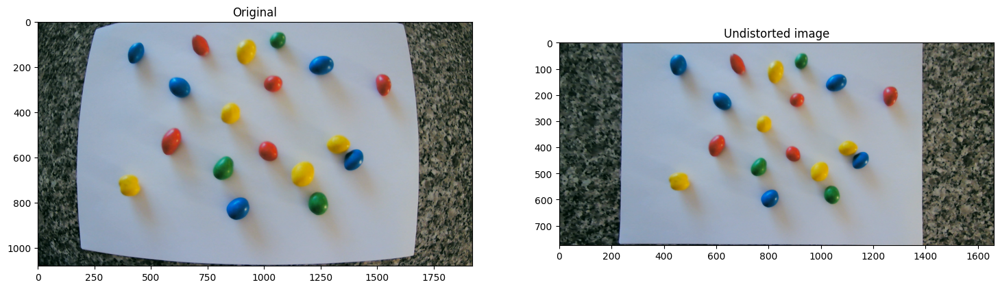

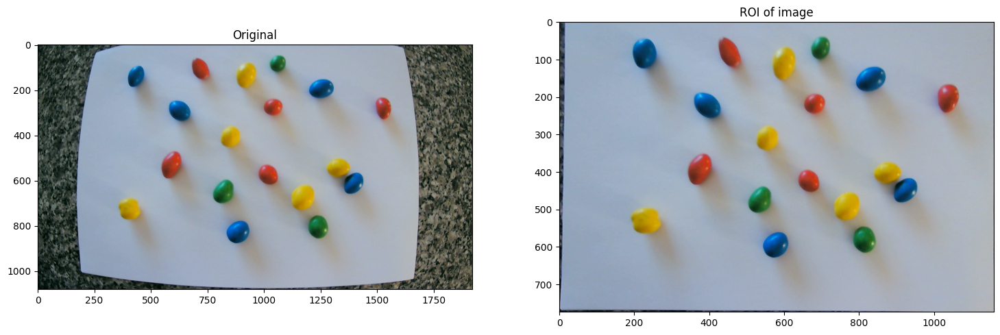

In [ ]:
# colocar foto da imagem sem distorcao

original_image = cv2.imread('/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 3.png')
image = undistort_image(original_image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
display_image_plt(image, config, original_image, 'Undistorted image')
image = segment_roi(image)
display_image_plt(image, config, original_image, 'ROI of image')


### Filtering image
We are filtering images before applying our processment. We are using GaussianBlur filter, that is highly effective in removing Gaussian noise from an image [2].

In [ ]:
def filter_image(img, kernel):
    if isinstance(img, list):
        imgs = []
        for im in img:
            imgs.append(cv2.GaussianBlur(im, (11,11), 10))
        return imgs

    filter = cv2.GaussianBlur(img, (11,11), 10)
    return filter


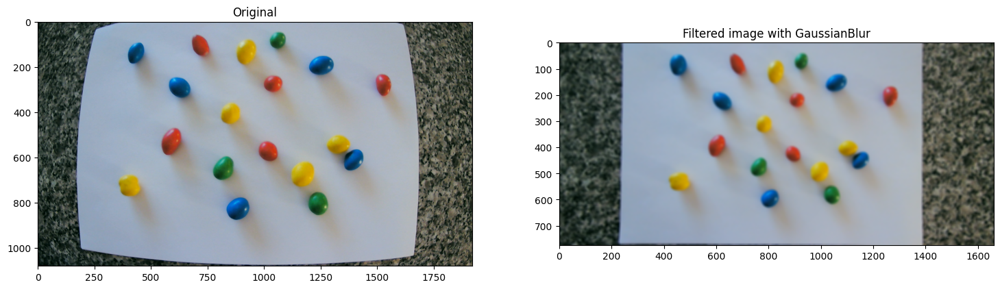

In [ ]:
# colocar foto da imagem sem distorcao

original_image = cv2.imread('/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 3.png')
image = undistort_image(original_image)
image = filter_image(image, None)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
display_image_plt(image, config, original_image, 'Filtered image with GaussianBlur')

### Closing
The provided Python code is a function called closing(), which takes a list of images as input and returns a list of processed images. The function uses the closing operation, which is a morphological operation that combines dilation and erosion to close small holes in objects and connect small broken parts of objects.

Here is a brief explanation of the code:

The first line of the function checks if the input image is a list. If it is not, it converts it to a list.
The next line creates a kernel, which is a small matrix used in morphological operations. The kernel in this case is a 11x11 matrix of ones.
The next loop iterates over the list of images and applies the closing operation to each image.
The processed images are appended to a list, which is then returned by the function.

In [ ]:
def closing(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    kernel = np.ones((13, 13), np.uint8)
    result = []
    for img in imgs:
        # Apply the closing operation
        result.append(cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel))
    return result

In [ ]:
def display_image(imgs, config, original_image=None):
    print_color_name = True
    if not isinstance(imgs, list):
        print_color_name = False
        imgs = [imgs]

    for i, img in enumerate(imgs):
        title = config["mms_config"][i]["color"] if print_color_name else 'img'
        cv2_imshow(img)


**Apply mask**

This function applies a HSV color mask in the image, that is, we define a range of values for each component of HSV and extract oa binary image that contains the pixels inside the range.

This is useful to segmentate objects by color and in the case of our assignment, we are using it to identify MMs by color.

In [ ]:
def apply_mask(img, config):
    imgs = []
    for config in config["mms_config"]:
        result = img.copy()


        if isinstance(config["lower_mask"], list):
            final_mask = None
            for lower,upper in zip(config["lower_mask"], config["upper_mask"]):
                current_mask = cv2.inRange(img, lower, upper)
                if final_mask is None:
                    final_mask = current_mask
                else:
                    final_mask += current_mask
        else:
            final_mask = cv2.inRange(img, config["lower_mask"], config["upper_mask"])

        imgs.append(final_mask)
        #imgs.append(cv2.bitwise_and(result, result, mask=color_mask))
    return imgs


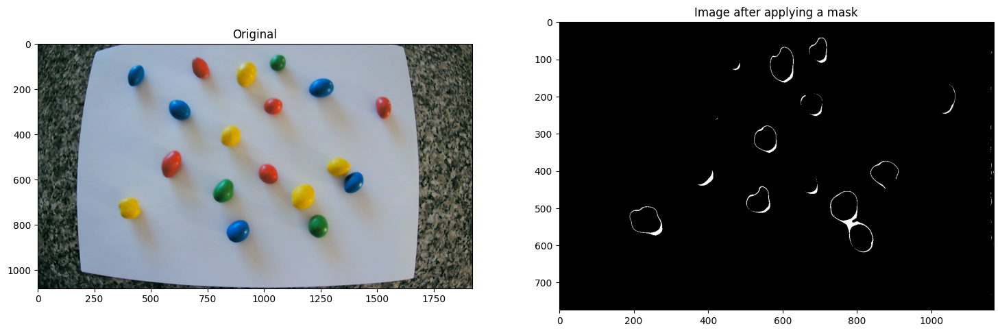

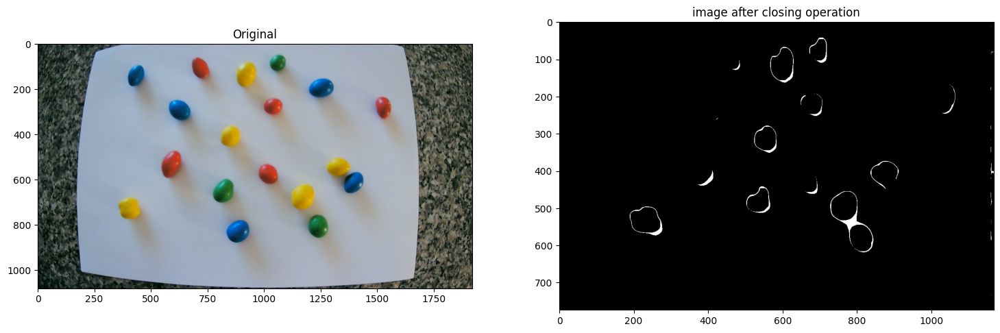

In [ ]:
original_image = cv2.imread('/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 3.png')
image = undistort_image(original_image)
image = segment_roi(image)
image = filter_image(image, None)
[image, _,_, _,_] = apply_mask(image, config)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
display_image_plt(image, config, original_image, 'Image after applying a mask')

[image] = closing(image)
display_image_plt(image, config, original_image, 'image after closing operation')

### Find edges

The find_edges() function takes a list of images and a configuration dictionary as input and returns a list of processed images and a Pandas DataFrame containing information about the detected edges.

The function works by first using the Canny edge detector to detect the edges in each image. Then, it dilates the image to thicken the edges. Next, it uses the OpenCV findContours() function to detect contours in the dilated image. Finally, it draws the contours on the original image and adds a new row to the Pandas DataFrame containing the color, area in pixels, and area in square millimeters of the object whose edge was detected.

In summary, the find_edges() function is a simple but effective way to detect edges in images using Python and OpenCV.

=> Explicar conversão
=> restrição da área

In [ ]:
def find_edges(imgs, config):
    #report = [{"color": color["color"]} for color in config["mms_config"]]
    report = pd.DataFrame(columns=['color', 'areaPixel', 'areaMm'])
    contours = []
    for i, img in enumerate(imgs):
        #canny = cv2.Canny(img, 100, 500)

        #dilated = cv2.dilate(canny, (1, 1), iterations=0)

        #(cnt, hierarchy) = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        (cnt, hierarchy) = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        new_cnt = []
        for pic, contour in enumerate(cnt):
            area = cv2.contourArea(contour)
            if area > 700:
                new_cnt.append(contour)
                new_line = {"color": config['mms_config'][i]["color"], "areaPixel": area, "areaMm": area/((52/11)**2)}
                report = pd.concat( [report, pd.DataFrame([new_line])], ignore_index=True)
        contours+=new_cnt
        cv2.drawContours(img, new_cnt, -1, (0, 255, 0), 2)

    return imgs, report, contours


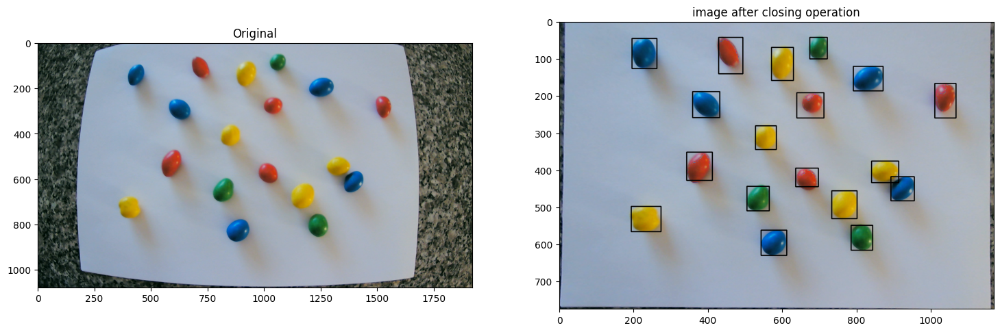

In [ ]:
original_image = cv2.imread('/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 3.png')

image = convert_color_space(original_image)
image = undistort_image(image)
image = segment_roi(image)
images_filtered = image
images = filter_image(image, 100)
images = closing(images)
images = apply_mask(image, config)
images, report, contours = find_edges(images, config)

original_image_copy = images_filtered.copy()
for contour in contours:
    # Get the rectangle that bounds the contour
    x, y, w, h = cv2.boundingRect(contour)

    # You can adjust the size of the rectangle here by modifying x, y, w, and h
    # Draw the rectangle on the original image
    cv2.rectangle(original_image_copy, (x, y), (x + w, y + h), (0, 255, 0), 2)  # green rectangle with thickness 2

original_image_copy = cv2.cvtColor(original_image_copy, cv2.COLOR_HSV2RGB)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
display_image_plt(original_image_copy, config, original_image, 'image after closing operation')


# Automation

The following sequence of functions is our pipeline to detect the MMs and give a report of the image. The report will consist of the number of MMs detected, the area and its standard deviation.

The pipeline os composed of:
1. Conversion of color into the HSV color space
2. Undistortion fo the image based on the parameters of the camera
3. Segmentation of the Region of Interest
4. Filtering the image before the processment
5. Morphological operation of closing, so we can fill some gaps in the image
6. Mask to each color of MMs, this way we can inspect each color from the original image
7. application of canny algorithm to edge detection in order to identify MMs

# C.I Define a ROI (region of interest) for the image

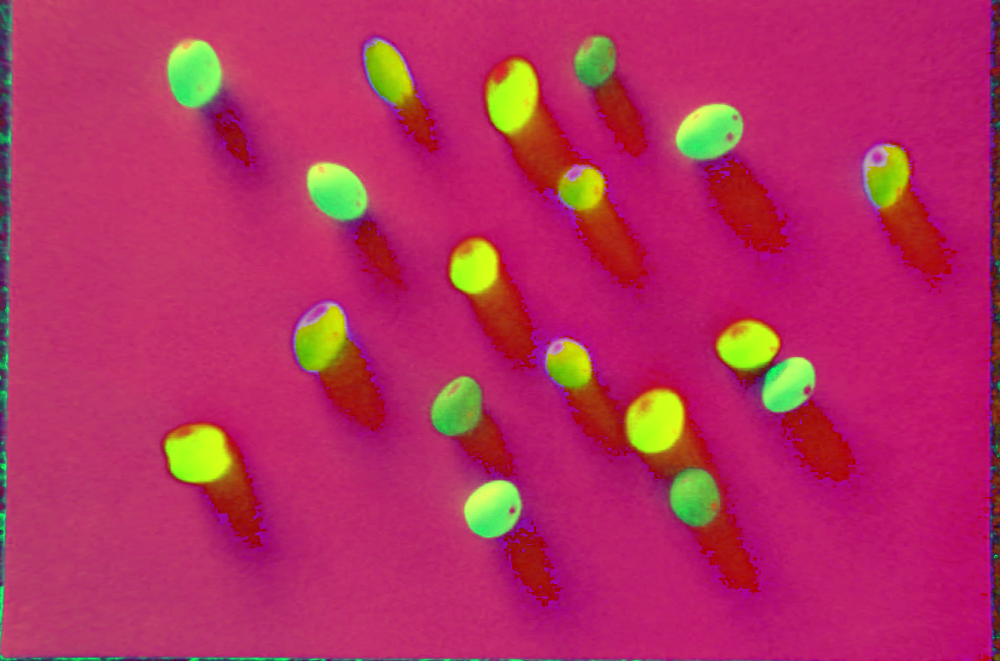

In [ ]:
original_image = cv2.imread('/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 3.png')
image = convert_color_space(original_image)
image = undistort_image(image)
image = segment_roi(image)
display_image(image, config, original_image)


## C.II Calculate the number of M&M per color for all images provided

In [ ]:
image_dir = '/content/drive/MyDrive/data_assignment/data/WhiteBackground'
image_files = glob.glob(os.path.join(image_dir, '*.png'))
final_report = pd.DataFrame()
for img in image_files:
    image = cv2.imread(img)
    image = convert_color_space(image)
    image = undistort_image(image)
    image = segment_roi(image)
    images = filter_image(image, 100)
    images = closing(images)
    images = apply_mask(image, config)
    images, report, _ = find_edges(images, config)
    final_report = pd.concat([final_report, report], ignore_index=True)

summary = final_report.groupby('color')['areaMm'].agg(['size', 'mean', 'std'])
summary['size']

color
blue      15
green      3
red       10
yellow    15
Name: size, dtype: int64


## C.III Determine the average area for peanuts in pixels, considering the image “calib_img 3”;
1. Show all peanuts that were detected.
2. Discuss the limitations of the peanut detection method used
(in 2 sentences).

In [ ]:
image = cv2.imread('/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 3.png')

image = convert_color_space(image)
image = undistort_image(image)
image = segment_roi(image)
images = filter_image(image, 100)
images = closing(images)
images = apply_mask(image, config)
images, report,_ = find_edges(images, config)
summary = report['areaPixel'].agg(['size', 'mean', 'std'])

In [ ]:
summary['mean']

2942.75

The above value is the average area for peanuts in pixel in image "calib_img 3".

Limitations: One of the problems we encounter in the project is to find the optimal color parameters (HSV components) to detect the MMs, so the software has some limitations and should be executed in a controled environment. Because of that, the main limitation is to identify the color of MMs, so the color mask is sensible to noises.

A secondary implication is the resulting area of the MM, as the color wasn't correctly addressed, the algorithm can't evaluate the proper area for the chocolate. The light reflect can also create noises, reducing the precision of our algoritm.

Finally, the count of MMs has a reduced precision when we don't have a white background, because brown color mixes with the gray of the background.

## C.IV. Determine the average area (and standard deviation) for peanuts in millimeters and grouped by color, considering images “calib_img 2” and “calib_img 3”.
1. Show the result in a table color vs area and standard deviation.
2. Discuss the limitation of the method implemented (in 2 sentences).

In [ ]:
image_files = ['/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 2.png', '/content/drive/MyDrive/data_assignment/data/WhiteBackground/calib_img 3.png']

In [ ]:
#final_report = pd.DataFrame()
for img in image_files:
    image = cv2.imread(img)
    image = convert_color_space(image)
    image = undistort_image(image)
    image = segment_roi(image)
    images = filter_image(image, 100)
    images = closing(images)
    images = apply_mask(image, config)
    images, report,_ = find_edges(images, config)
    #final_report = pd.concat([final_report, report] , ignore_index=True)

    summary = report.groupby('color')['areaMm'].agg(['size', 'mean', 'std'])
    print(summary)


        size        mean        std
color                              
blue       5  155.756176  23.850010
red        5  125.206361  29.386847
yellow     5  159.949112  25.945863
        size        mean        std
color                              
blue       5  159.407655  24.856034
green      3  106.650641  28.406301
red        5   94.763942  14.121310
yellow     5  155.899371  26.400297


### Limitations (C.IV.II and C.III II)
In this case, it was explicity the limitation caused by the parameters of the color mask. Both images, 3 and 4 have the same MMs, and we had similar values of area for the blue and yellow MM. In fact, those colors were easier to select with the HSV threshold. However, we have a discrepancy in area related to the red MMs because the red color was more complex to detect, leading to different areas.

# C.V Recommendations

- Prover uma iluminacao estavel sobre os MMs, que nao seja muito forte
- Utilizar sempre uma superficie branca como background dos MMs, pois a superficie cinza mistura um pouco com os MMs marrons e dificulta o processamento da imagem.
- Use a light diffuser, so the MMs won't have a reflection of the light that saturates the processment
- invest in a camera with a good CCD sensor instead of CMOS, because those sensors are usually more resistent to noises and they have better color accuracy.

## D Consider the images retrieved from a Grey Background and repeat the previous point without defining a region of interest.



## D.I. Region of interest

In this case, when the background is grey, the algorithm can't properly select a region of interest

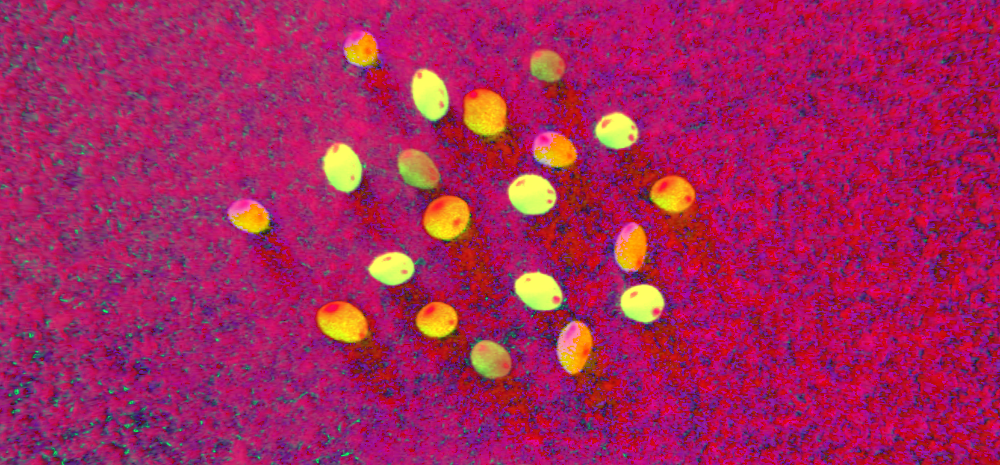

In [ ]:
original_image = cv2.imread('/content/drive/MyDrive/data_assignment/data/GreyBackground/calib_img 3.png')
image = convert_color_space(original_image)
image = undistort_image(image)
image = segment_roi(image)
display_image(image, config, original_image)

## D.II Calculate the number of M&M per color for all images provided

In [ ]:
image_dir = '/content/drive/MyDrive/data_assignment/data/WhiteBackground'
image_files = glob.glob(os.path.join(image_dir, '*.png'))
final_report = pd.DataFrame()
for img in image_files:
    image = cv2.imread(img)
    image = convert_color_space(image)
    image = undistort_image(image)
    image = segment_roi(image)
    images = filter_image(image, 100)
    images = closing(images)
    images = apply_mask(image, config)
    images, report, _ = find_edges(images, config)
    final_report = pd.concat([final_report, report], ignore_index=True)

summary = final_report.groupby('color')['areaMm'].agg(['size', 'mean', 'std'])
summary['size']

color
blue      15
green      3
red       10
yellow    15
Name: size, dtype: int64

## D.III Determine the average area for peanuts in pixels, considering the image “calib_img 3”;
1. Show all peanuts that were detected.
2. Discuss the limitations of the peanut detection method used
(in 2 sentences).

In [ ]:
image = cv2.imread('/content/drive/MyDrive/data_assignment/data/GreyBackground/calib_img 3.png')

image = convert_color_space(image)
image = undistort_image(image)
image = segment_roi(image)
images = filter_image(image, 100)
images = closing(images)
images = apply_mask(image, config)
images, report,_ = find_edges(images, config)
summary = report['areaPixel'].agg(['size', 'mean', 'std'])

In [ ]:
summary['mean']

3172.25

## D.IV. Determine the average area (and standard deviation) for peanuts in millimeters and grouped by color, considering images “calib_img 2” and “calib_img 3”.
1. Show the result in a table color vs area and standard deviation.
2. Discuss the limitation of the method implemented (in 2 sentences).

In [ ]:
image_files = ['/content/drive/MyDrive/data_assignment/data/GreyBackground/calib_img 2.png', '/content/drive/MyDrive/data_assignment/data/GreyBackground/calib_img 3.png']
#final_report = pd.DataFrame()
for img in image_files:
    image = cv2.imread(img)
    image = convert_color_space(image)
    image = undistort_image(image)
    image = segment_roi(image)
    images = filter_image(image, 100)
    images = closing(images)
    images = apply_mask(image, config)
    images, report,_ = find_edges(images, config)
    #final_report = pd.concat([final_report, report] , ignore_index=True)

    summary = report.groupby('color')['areaMm'].agg(['size', 'mean', 'std'])
    print(summary)


        size        mean        std
color                              
blue       7  157.994241  14.037763
green      3   79.182507  15.736535
yellow     5   90.785799  25.191671
        size        mean        std
color                              
blue       7  164.441225  16.409680
green      3   93.569157  21.070793
red        5  144.555621  29.359836
yellow     5  136.899149  28.081188


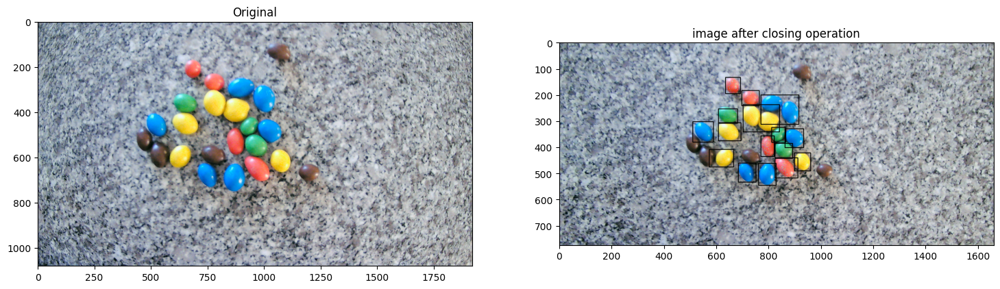

In [ ]:
original_image = cv2.imread('/content/drive/MyDrive/data_assignment/data/GreyBackground/calib_img 5.png')

image = convert_color_space(original_image)
image = undistort_image(image)
image = segment_roi(image)
images_filtered = image
images = filter_image(image, 100)
images = closing(images)
images = apply_mask(image, config)
images, report, contours = find_edges(images, config)

original_image_copy = images_filtered.copy()
for contour in contours:
    # Get the rectangle that bounds the contour
    x, y, w, h = cv2.boundingRect(contour)

    # You can adjust the size of the rectangle here by modifying x, y, w, and h
    # Draw the rectangle on the original image
    cv2.rectangle(original_image_copy, (x, y), (x + w, y + h), (0, 255, 0), 2)  # green rectangle with thickness 2

original_image_copy = cv2.cvtColor(original_image_copy, cv2.COLOR_HSV2RGB)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
display_image_plt(original_image_copy, config, original_image, 'image after closing operation')

## D.V. Limitations of grey background

- After executing the algorithm on the gray background, we can observe that the gray background is a limitation for the ROI segmentation. Without a white background, the algorithm can't select a region to segment, so it essentially runs on the entire image.

- Another limitation concerns the brown color, which HSV is within a range of HUE levels similar to red, but with different levels of Value and Saturation. While red has high levels of saturation and value, brown has low levels for those components, and the algorithm confuses it with the gray background, which has low values for the same components.

- Blue and yellow colors didn't have that problem because they have a very specific range of HUE levels and high value and saturation, so even with the gray background, we obtained good segmentation for them.

- One final limitation is the clustering of M&Ms, as we can see in the last image, where two blue and two yellow M&Ms were segmented as only one.

### References

[1] https://docs.opencv.org/4.x/df/d9d/tutorial_py_colorspaces.html


[2] https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html


[3] https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html

[4] https://www.geeksforgeeks.org/camera-calibration-with-python-opencv/

[5] https://floridapoly.edu/educational-outreach/lessons/assets/counting-m-ms-library-imports.pdf